# Y Transform

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import os
if not os.path.exists("images"): 
    os.mkdir("images")
pd.set_option('display.max_columns', None)
from scipy.stats import pointbiserialr, f_oneway
from scipy.stats import boxcox

In [2]:
housing_d = pd.read_csv('housing_cleaned.csv', index_col=0)

In [3]:
housing_d = housing_d.convert_dtypes()
housing_d.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2559 entries, 909176150 to 906223180
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   GrLivArea      2559 non-null   Int64  
 1   SalePrice      2559 non-null   Int64  
 2   MSSubClass     2559 non-null   Int64  
 3   MSZoning       2559 non-null   string 
 4   LotFrontage    2559 non-null   Int64  
 5   LotArea        2559 non-null   Int64  
 6   Street         2559 non-null   string 
 7   LotShape       2559 non-null   string 
 8   LandContour    2559 non-null   string 
 9   Utilities      2559 non-null   string 
 10  LotConfig      2559 non-null   string 
 11  LandSlope      2559 non-null   string 
 12  Neighborhood   2559 non-null   string 
 13  Condition1     2559 non-null   string 
 14  Condition2     2559 non-null   string 
 15  BldgType       2559 non-null   string 
 16  HouseStyle     2559 non-null   string 
 17  OverallQual    2559 non-null   Int64  
 18  

<Axes: title={'center': 'As is'}, ylabel='Frequency'>

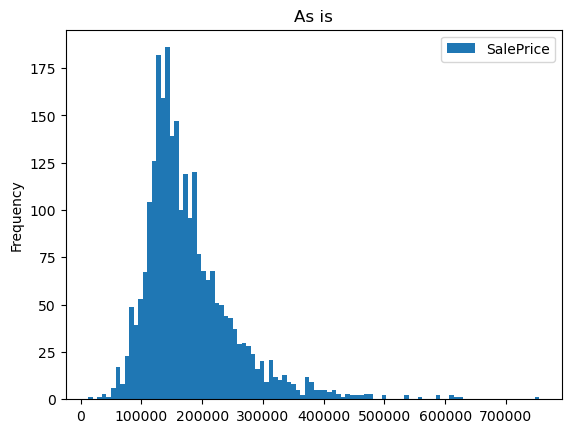

In [31]:
#histogram of Sales Price
housing_d[['SalePrice']].plot.hist(bins = 100, title = 'As is') #kind of skewed

<Axes: title={'center': 'Log'}, ylabel='Frequency'>

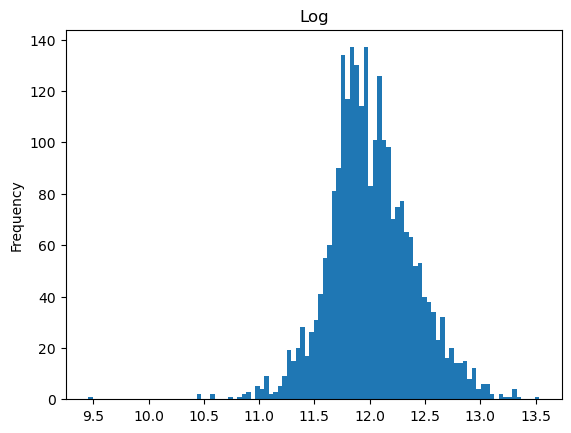

In [32]:
housing_d['SalesPrice_log'] = np.log(housing_d['SalePrice'])
housing_d['SalesPrice_log'].plot.hist(bins = 100, title = 'Log')

Determines the power transformation applied to the data. Optimal lambda: -0.0442290934813688


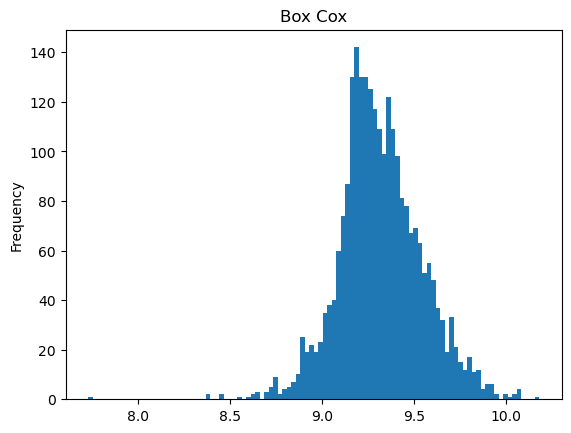

In [38]:
housing_d['SalePrice_box'], lambda_value = boxcox(housing_d['SalePrice'])
# plt.figure(figsize=(12, 6))
# plt.hist(housing_d['SalePrice_box'], bins=100, edgecolor='k', alpha=0.7)
housing_d['SalePrice_box'].plot.hist(bins=100, title = 'Box Cox')
# plt.title('Box-Cox Transformed Data Distribution')
# plt.show()
print(f"Determines the power transformation applied to the data. Optimal lambda: {lambda_value}")

In [41]:
#select int/float
housing_d['SalePrice_2'] = housing_d['SalePrice']
corr_matrix = housing_d.select_dtypes(include=['float64','int64']).corr()

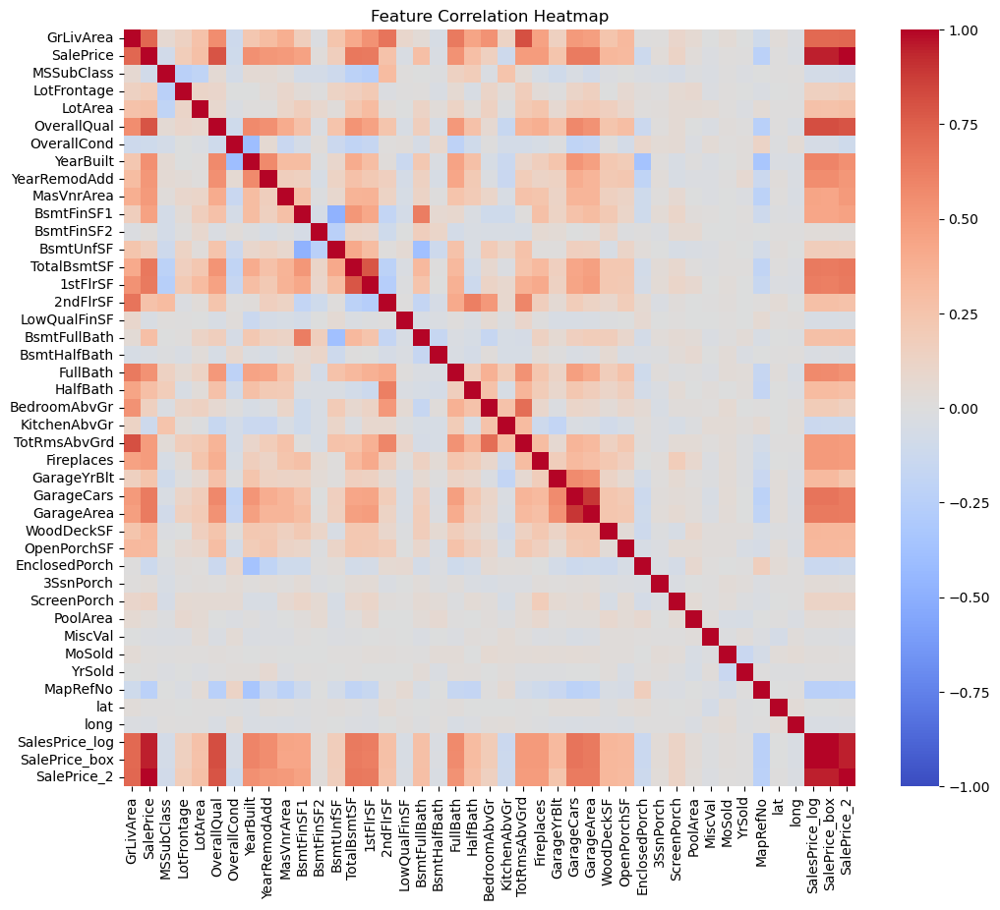

In [42]:
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Feature Correlation Heatmap')
plt.show()

SalePrice         15.007373
SalesPrice_log    15.240983
SalePrice_box     15.207244
dtype: float64

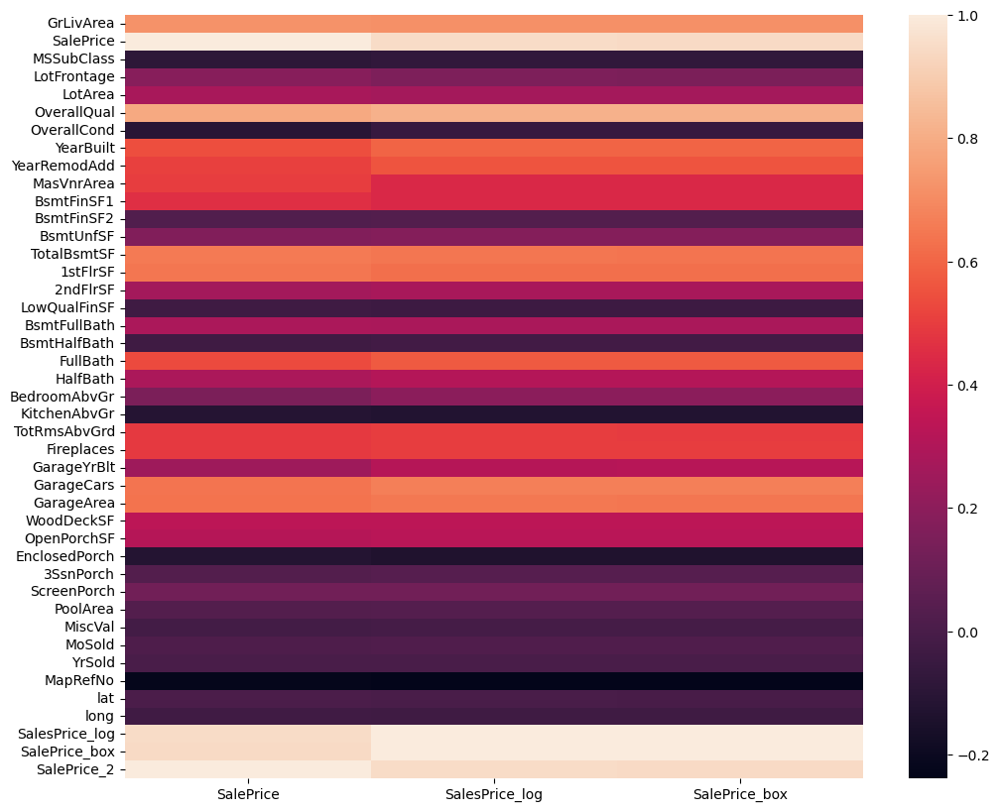

In [49]:
#Comparing corr of all the Salesprice options: 1. No change, 2. Log, 3. Box cox. No huge difference. 

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix[['SalePrice','SalesPrice_log','SalePrice_box']])
abs(corr_matrix[['SalePrice','SalesPrice_log','SalePrice_box']]).sum() #Log has the highest corr sum

Text(0.5, 1.0, 'Abs Values Feature Correlation Heatmap')

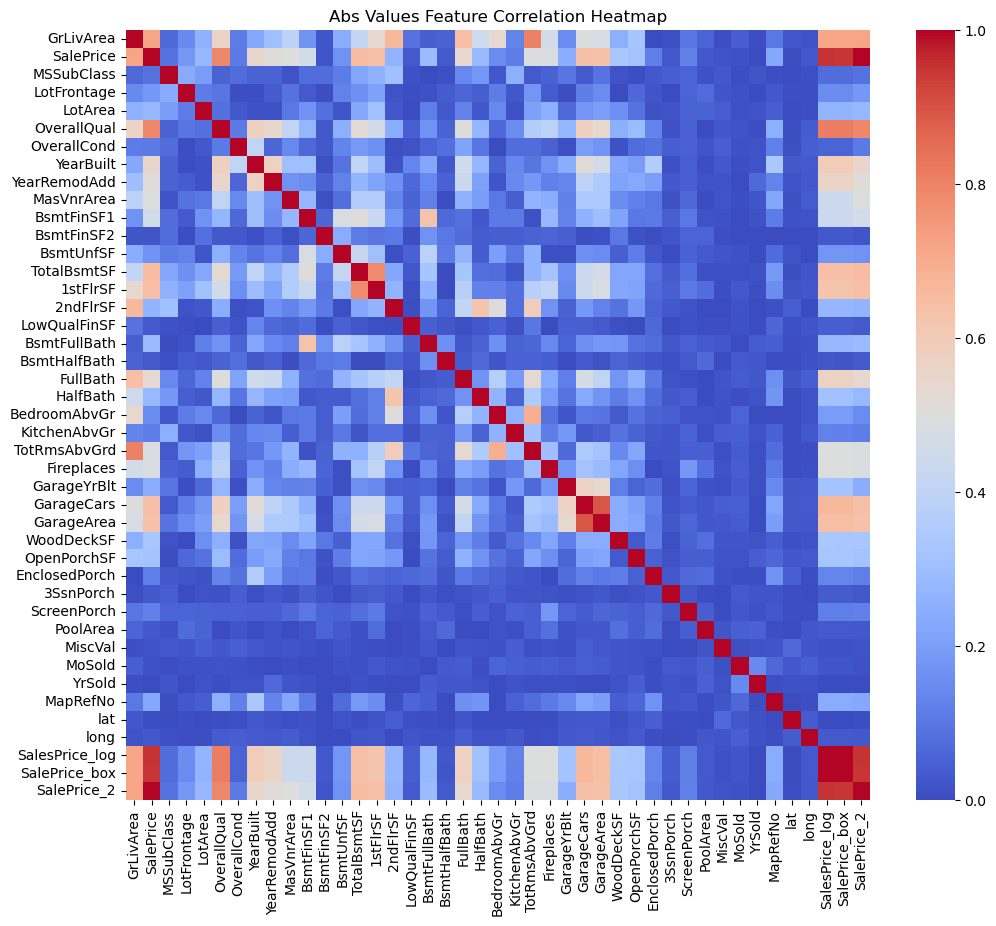

In [44]:
#absolute values

plt.figure(figsize=(12, 10))
sns.heatmap(abs(corr_matrix), cmap='coolwarm', vmin=0, vmax=1)
plt.title('Abs Values Feature Correlation Heatmap')

Text(0.5, 1.0, 'Corr Threshold Map')

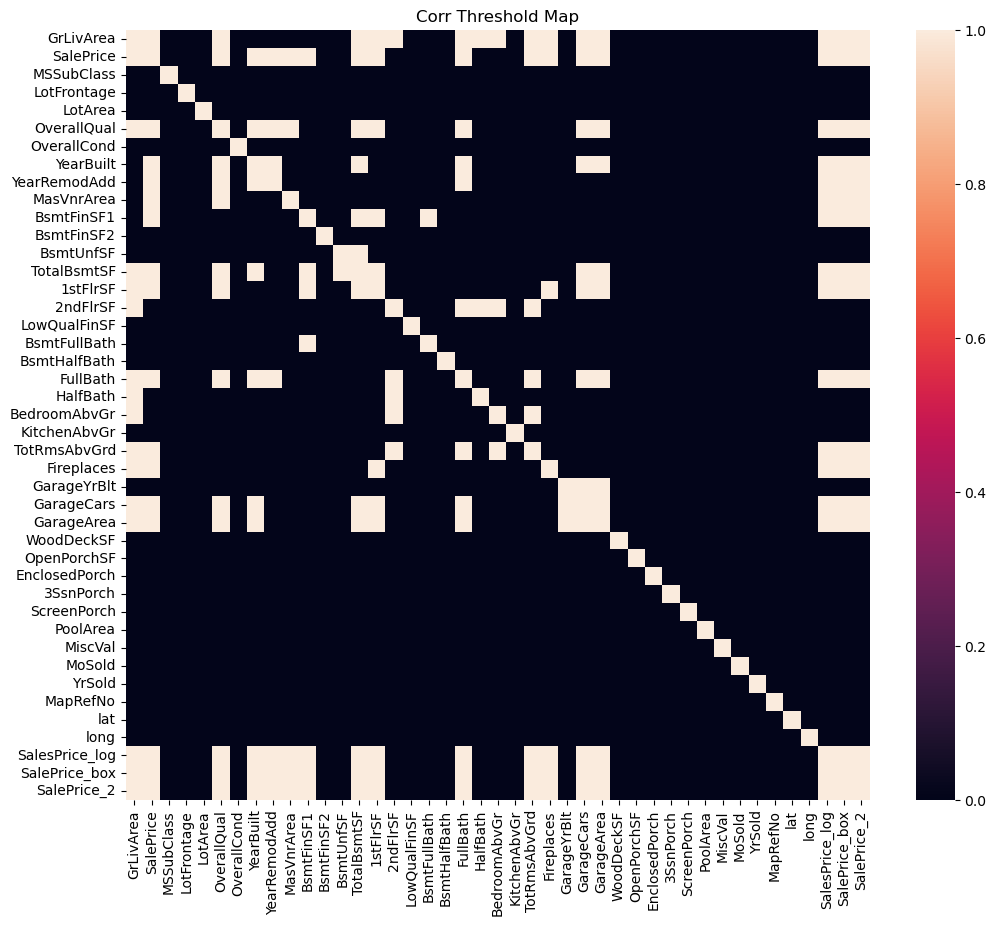

In [45]:
threshhold = .4

plt.figure(figsize=(12, 10))
sns.heatmap(abs(corr_matrix>threshhold))
plt.title('Corr Threshold Map')

#### Correlations of Features and Salesprice. 

,SalePrice
SalePrice_2,1.000000
SalePrice,1.000000
SalesPrice_log,0.951051
SalePrice_box,0.946373
OverallQual,0.790285
GrLivArea,0.719803
TotalBsmtSF,0.652771
1stFlrSF,0.643106
GarageCars,0.639497
GarageArea,0.636343


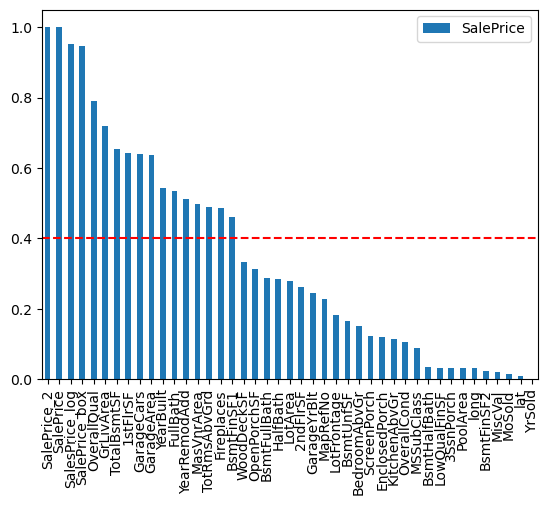

In [46]:
#Continuos variables

abs(corr_matrix[['SalePrice']]).sort_values(by = 'SalePrice', ascending = False).plot.bar()
plt.axhline(y=0.4, color='r', linestyle='--', label='y=0.5')
top_15 = abs(corr_matrix[['SalePrice']]).sort_values(by = 'SalePrice', ascending = False).head(15)
top_15
# Top 14 Cont Features in terms of correlation. 
# Overall Condition is not highly correlated to SalespPrice. 

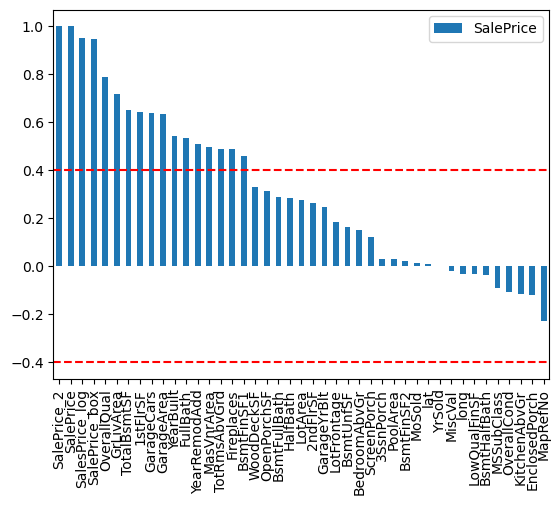

In [47]:
corr_matrix[['SalePrice']].sort_values(by = 'SalePrice', ascending = False).plot.bar()
plt.axhline(y=0.4, color='r', linestyle='--', label='y=0.5')
plt.axhline(y=-0.4, color='r', linestyle='--', label='y=0.5')

#No features that are negavtively correlated to SalePrice

In [48]:
# F statistics - The F-statistic and p-value indicate whether there are significant differences in the means of the continuous variable across different categories.

from scipy.stats import pointbiserialr, f_oneway
housing_s = housing_d.copy()
test = []
for columns in housing_s.select_dtypes(
    include=['string']).drop(
    columns = 'Prop_Addr').columns:
    housing_s[columns] = housing_d[columns].astype('category').cat.codes
    groups = [housing_s[housing_s[columns] == label]['SalePrice'] for label in housing_s[columns].unique()]
    anova_result = f_oneway(*groups)
    test.append([columns, anova_result.statistic,anova_result.pvalue])
cat_corr = pd.DataFrame(test, columns=['Feature','F_Statistic', 'P_Value'])
cat_corr

,Feature,F_Statistic,P_Value
0,MSZoning,66.434319,2.103725e-65
1,Street,4.745197,2.947125e-02
2,LotShape,87.292790,9.009807e-54
3,LandContour,29.749053,6.694355e-19
4,Utilities,0.713924,3.982234e-01
5,LotConfig,13.994054,2.687440e-11
6,LandSlope,8.902709,1.402838e-04
7,Neighborhood,130.811820,0.000000e+00
8,Condition1,15.360388,3.080254e-22
9,Condition2,9.542768,9.446360e-12


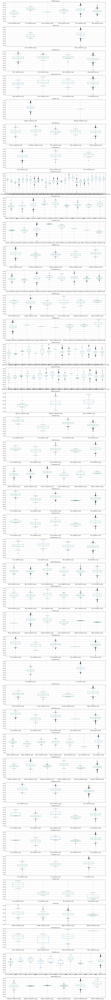

In [55]:
#Boxplots by categroical features

fig, axs = plt.subplots(41, 1, figsize=(20, 200))
for num, column in enumerate(housing_d.select_dtypes(include='string').drop(columns = 'Prop_Addr').columns):
    housing_d[[column,'SalesPrice_log']].reset_index().groupby(column).boxplot(
        fontsize=12, column = 'SalesPrice_log', subplots = False, ax = axs[num])
    axs[num].set_title(column + ' Log')
    axs[num].grid(True)
plt.show()

In [56]:
fig, axs = plt.subplots(82, 1, figsize=(20, 400))
for num, column in enumerate(housing_d.select_dtypes(include='string').drop(columns = 'Prop_Addr').columns):
    housing_d[[column,'SalePrice']].reset_index().groupby(column).boxplot(
        fontsize=12, column = 'SalePrice', subplots = False, ax = axs[num*2])
    axs[num*2].set_title(column)
    axs[num*2].grid(True)
    housing_d[[column,'SalesPrice_log']].reset_index().groupby(column).boxplot(
        fontsize=12, column = 'SalesPrice_log', subplots = False, ax = axs[num*2 + 1])
    axs[num*2 + 1].set_title(column + ' Log')
    axs[num*2 + 1].grid(True)
plt.show()

In [62]:
#Continous Variables

fig, axs = plt.subplots(86, 1, figsize=(20, 450))
for num, column in enumerate(housing_d.select_dtypes(include=['int','float']).columns):
    housing_d[[column,'SalePrice']].plot.scatter(x=column, y = 'SalePrice', ax = axs[num*2])
    axs[num*2].set_title(column)
    axs[num*2].grid(True)
    housing_d[[column,'SalesPrice_log']].plot.scatter(x=column, y = 'SalesPrice_log', ax = axs[2*num+1])
    axs[2*num+1].set_title(column + ' Log')
    axs[2*num+1].grid(True)
plt.show()